### C18_filtre.ipynb
### Bu adımda kick ve snare seslerinden 3'er örnek kullanılarak bu sinyallerin zaman ve frekans domaininde incelenmesi yapıldı ve buna uygun bir filtre tasarımı yapıldı.

In [31]:
import matplotlib.pyplot as plt # grafik çizimi için gerekli kütüphanenin aktifleştirilmesi
import numpy as np
import scipy.signal as sgnl

from scipy.io.wavfile import read # Ses dosyasının okunması için gerekli kütüphane
from scipy.io import loadmat
from IPython.lib.display import Audio
%matplotlib inline

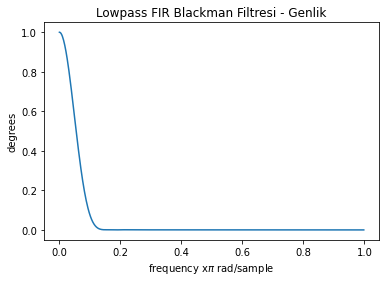

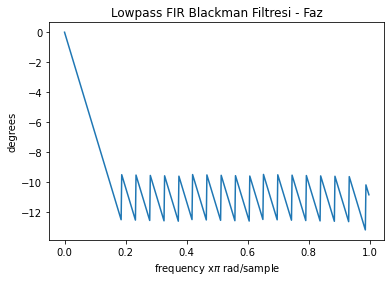

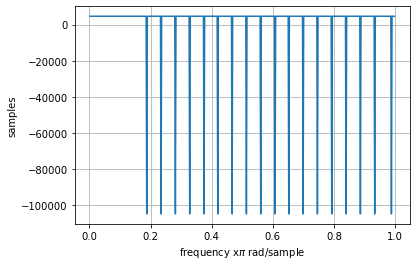

In [33]:
# importing an FIR filter
filter_data = loadmat('C18_lowpass-fir-blackman.mat')      # load the filter obtained from pyfda
Coeffs = filter_data['ba'].astype(np.float)   

b = Coeffs[0]       
w, Hw = sgnl.freqz(b)

Hw_mag = abs(Hw)
Hw_phs = np.unwrap(np.angle(Hw))

plt.figure()
plt.plot(w/np.pi, Hw_mag)
plt.title("Lowpass FIR Blackman Filtresi - Genlik")
plt.xlabel('frequency x$\pi$ rad/sample')
plt.ylabel('degrees')
plt.show()

plt.figure()
plt.plot(w/np.pi, Hw_phs)
plt.title("Lowpass FIR Blackman Filtresi - Faz")
plt.xlabel('frequency x$\pi$ rad/sample')
plt.ylabel('degrees')
plt.show()

# calculate the group delay of the system:
tau_w = -np.diff(Hw_phs)*(N/(2*np.pi))
plt.figure()
plt.plot(w[1::]/np.pi, tau_w)
plt.ylabel('samples'), plt.xlabel('frequency x$\pi$ rad/sample')
plt.grid()
plt.show()

(218880, 2)
44100


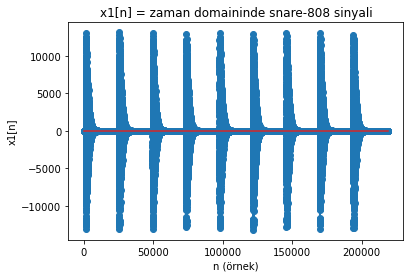

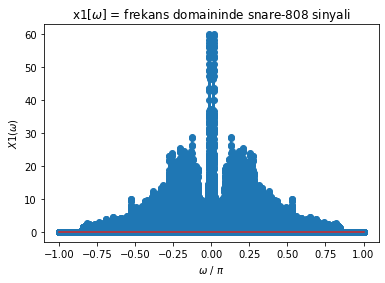

x1[n] işareti için:


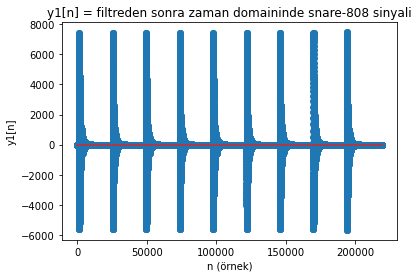

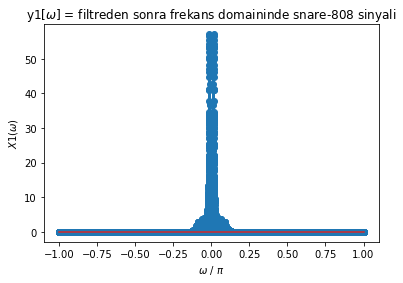

y1[n] işareti için:


In [18]:
Fs, x1 = read("C18_snare-808.wav")
print(x1.shape) # x'in boyut bilgisi
print(Fs)
x1n = x1[:,1] # 1. kanal örnekleri
N = len(x1)
n=np.arange(0,N) # örnekleme iki periyot olacak şekilde

w = np.arange(-np.pi, np.pi, 2*np.pi/N) # omega ekseninin tanımlanması
x1w = np.fft.fftshift(np.fft.fft(x1n,N)/N) # işaretin Fourier transformu

# x1[n] sinyalini çizdirilmesi
plt.figure()
plt.stem(n,x1n)
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("x1[n]") # y ekseninin isimlendirilmesi
plt.title("x1[n] = zaman domaininde snare-808 sinyali")

# X(w) işaretinin çizdirilmesi
plt.figure()
plt.stem(w/np.pi,abs(x1w))
plt.xlabel("$\omega$ / $\pi$") # x ekseninin isimlendirilmesi
plt.ylabel("$X1(\omega)$") # y ekseninin isimlendirilmesi
plt.title("x1[$\omega$] = frekans domaininde snare-808 sinyali")
plt.show()

# ses dosyasının oynatılabilmesi için
print('x1[n] işareti için:')
display(Audio(x1n, rate=Fs))

#-------------------- filtreden geçirme işlemi ---------#
filter_data = loadmat('C18_lowpass-fir-blackman.mat')
Coeffs = filter_data['ba'].astype(np.float)   

b = Coeffs[0] # filtre katsayısı
# a katsayısı için direkt 1 yazılmıştır çünkü kullanılan filtre bir fir filtredir.
y1n = sgnl.lfilter(b, 1, x1n) # filtre sonrası elde edilen ses işareti

# y1[n] sinyalini çizdirilmesi
plt.figure()
plt.stem(n,y1n)
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("y1[n]") # y ekseninin isimlendirilmesi
plt.title("y1[n] = filtreden sonra zaman domaininde snare-808 sinyali")


y1w = np.fft.fftshift(np.fft.fft(y1n,N)/N) # işaretin Fourier transformu

# Y(w) işaretinin grafiğinin çizdirilmesiplt.figure()
plt.figure()
plt.stem(w/np.pi,abs(y1w))
plt.xlabel("$\omega$ / $\pi$") # x ekseninin isimlendirilmesi
plt.ylabel("$X1(\omega)$") # y ekseninin isimlendirilmesi
plt.title("y1[$\omega$] = filtreden sonra frekans domaininde snare-808 sinyali")
plt.show()

# ses dosyasının oynatılabilmesi için
print('y1[n] işareti için:')
display(Audio(y1n, rate=Fs))

---
---
---

(218880, 2)
44100


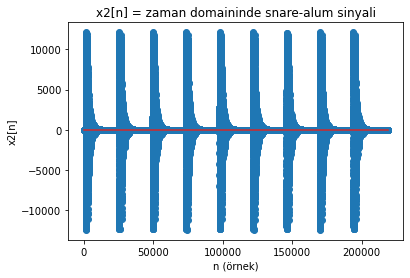

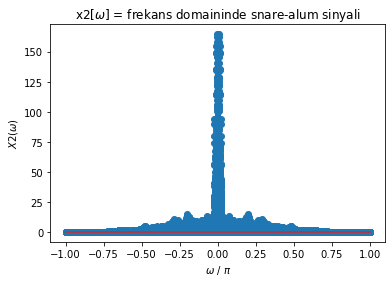

x2[n] işareti için:


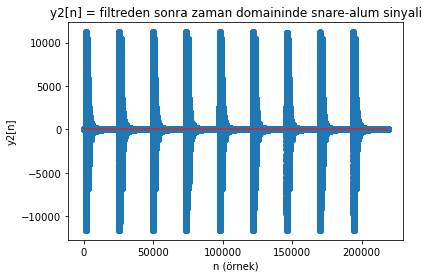

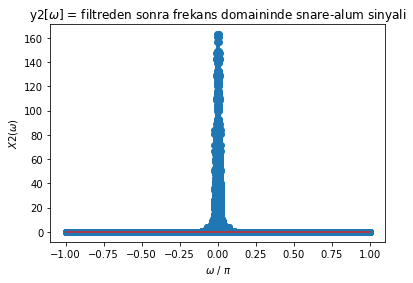

y2[n] işareti için:


In [19]:
Fs, x2 = read("C18_snare-alum.wav")
print(x2.shape) # x'in boyut bilgisi
print(Fs)
x2n = x2[:,1] # 1. kanal örnekleri
N = len(x2)
n=np.arange(0,N) # örnekleme iki periyot olacak şekilde

w = np.arange(-np.pi, np.pi, 2*np.pi/N) # omega ekseninin tanımlanması
x2w = np.fft.fftshift(np.fft.fft(x2n,N)/N) # işaretin Fourier transformu

# x2[n] sinyalini çizdirilmesi
plt.figure()
plt.stem(n,x2n)
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("x2[n]") # y ekseninin isimlendirilmesi
plt.title("x2[n] = zaman domaininde snare-alum sinyali")

# X2(w) işaretinin çizdirilmesi
plt.figure()
plt.stem(w/np.pi,abs(x2w))
plt.xlabel("$\omega$ / $\pi$") # x ekseninin isimlendirilmesi
plt.ylabel("$X2(\omega)$") # y ekseninin isimlendirilmesi
plt.title("x2[$\omega$] = frekans domaininde snare-alum sinyali")
plt.show()

# ses dosyasının oynatılabilmesi için
print('x2[n] işareti için:')
display(Audio(x2n, rate=Fs))

#-------------------- filtreden geçirme işlemi ---------#
filter_data = loadmat('C18_lowpass-fir-blackman.mat')
Coeffs = filter_data['ba'].astype(np.float)   

b = Coeffs[0] # filtre katsayısı
# a katsayısı için direkt 1 yazılmıştır çünkü kullanılan filtre bir fir filtredir.
y2n = sgnl.lfilter(b, 1, x2n) # filtre sonrası elde edilen ses işareti

# y2[n] sinyalini çizdirilmesi
plt.figure()
plt.stem(n,y2n)
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("y2[n]") # y ekseninin isimlendirilmesi
plt.title("y2[n] = filtreden sonra zaman domaininde snare-alum sinyali")


y2w = np.fft.fftshift(np.fft.fft(y2n,N)/N) # işaretin Fourier transformu

# Y(w) işaretinin grafiğinin çizdirilmesiplt.figure()
plt.figure()
plt.stem(w/np.pi,abs(y2w))
plt.xlabel("$\omega$ / $\pi$") # x ekseninin isimlendirilmesi
plt.ylabel("$X2(\omega)$") # y ekseninin isimlendirilmesi
plt.title("y2[$\omega$] = filtreden sonra frekans domaininde snare-alum sinyali")
plt.show()

# ses dosyasının oynatılabilmesi için
print('y2[n] işareti için:')
display(Audio(y2n, rate=Fs))

---
---
---

(218880, 2)
44100


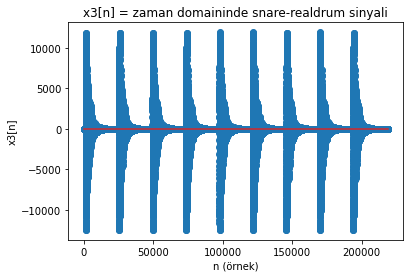

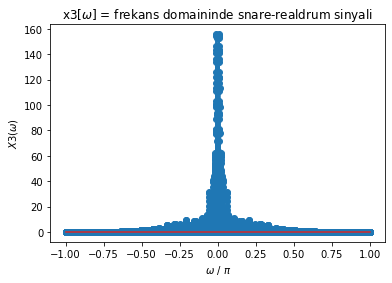

x3[n] işareti için:


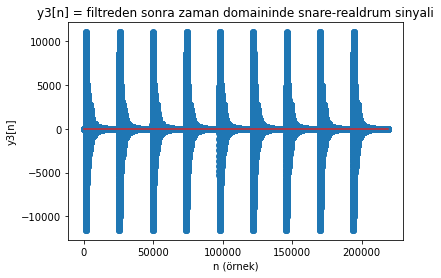

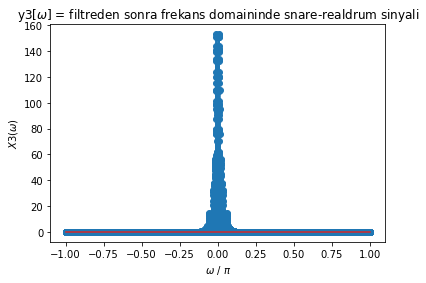

y3[n] işareti için:


In [20]:
Fs, x3 = read("C18_snare-realdrum.wav")
print(x3.shape) # x'in boyut bilgisi
print(Fs)
x3n = x3[:,1] # 1. kanal örnekleri
N = len(x3)
n=np.arange(0,N) # örnekleme iki periyot olacak şekilde

w = np.arange(-np.pi, np.pi, 2*np.pi/N) # omega ekseninin tanımlanması
x3w = np.fft.fftshift(np.fft.fft(x3n,N)/N) # işaretin Fourier transformu

# x3[n] sinyalini çizdirilmesi
plt.figure()
plt.stem(n,x3n)
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("x3[n]") # y ekseninin isimlendirilmesi
plt.title("x3[n] = zaman domaininde snare-realdrum sinyali")

# X3(w) işaretinin çizdirilmesi
plt.figure()
plt.stem(w/np.pi,abs(x3w))
plt.xlabel("$\omega$ / $\pi$") # x ekseninin isimlendirilmesi
plt.ylabel("$X3(\omega)$") # y ekseninin isimlendirilmesi
plt.title("x3[$\omega$] = frekans domaininde snare-realdrum sinyali")
plt.show()

# ses dosyasının oynatılabilmesi için
print('x3[n] işareti için:')
display(Audio(x3n, rate=Fs))

#-------------------- filtreden geçirme işlemi ---------#
filter_data = loadmat('C18_lowpass-fir-blackman.mat')
Coeffs = filter_data['ba'].astype(np.float)   

b = Coeffs[0] # filtre katsayısı
# a katsayısı için direkt 1 yazılmıştır çünkü kullanılan filtre bir fir filtredir.
y3n = sgnl.lfilter(b, 1, x3n) # filtre sonrası elde edilen ses işareti

# y3[n] sinyalini çizdirilmesi
plt.figure()
plt.stem(n,y3n)
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("y3[n]") # y ekseninin isimlendirilmesi
plt.title("y3[n] = filtreden sonra zaman domaininde snare-realdrum sinyali")


y3w = np.fft.fftshift(np.fft.fft(y3n,N)/N) # işaretin Fourier transformu

# Y3(w) işaretinin grafiğinin çizdirilmesiplt.figure()
plt.figure()
plt.stem(w/np.pi,abs(y3w))
plt.xlabel("$\omega$ / $\pi$") # x ekseninin isimlendirilmesi
plt.ylabel("$X3(\omega)$") # y ekseninin isimlendirilmesi
plt.title("y3[$\omega$] = filtreden sonra frekans domaininde snare-realdrum sinyali")
plt.show()

# ses dosyasının oynatılabilmesi için
print('y3[n] işareti için:')
display(Audio(y3n, rate=Fs))

---
---
---

(218880, 2)
44100


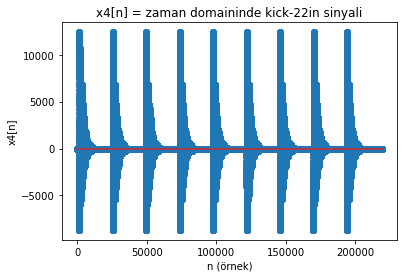

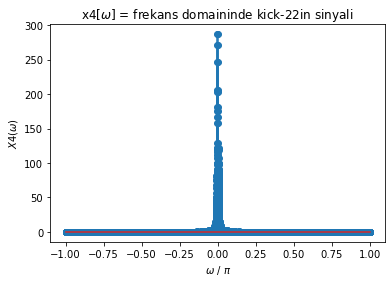

x4[n] işareti için:


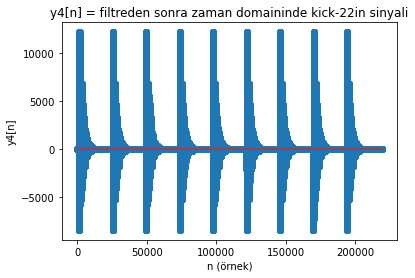

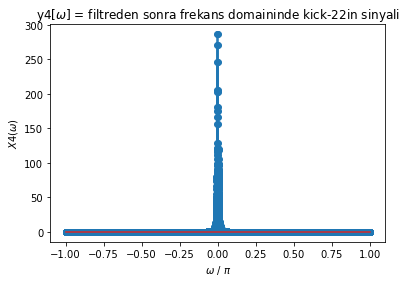

y4[n] işareti için:


In [21]:
Fs, x4 = read("C18_kick-22in.wav")
print(x4.shape) # x'in boyut bilgisi
print(Fs)
x4n = x4[:,1] # 1. kanal örnekleri
N = len(x4)
n=np.arange(0,N) # örnekleme iki periyot olacak şekilde

w = np.arange(-np.pi, np.pi, 2*np.pi/N) # omega ekseninin tanımlanması
x4w = np.fft.fftshift(np.fft.fft(x4n,N)/N) # işaretin Fourier transformu

# x4[n] sinyalini çizdirilmesi
plt.figure()
plt.stem(n,x4n)
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("x4[n]") # y ekseninin isimlendirilmesi
plt.title("x4[n] = zaman domaininde kick-22in sinyali")

# X4(w) işaretinin çizdirilmesi
plt.figure()
plt.stem(w/np.pi,abs(x4w))
plt.xlabel("$\omega$ / $\pi$") # x ekseninin isimlendirilmesi
plt.ylabel("$X4(\omega)$") # y ekseninin isimlendirilmesi
plt.title("x4[$\omega$] = frekans domaininde kick-22in sinyali")
plt.show()

# ses dosyasının oynatılabilmesi için
print('x4[n] işareti için:')
display(Audio(x4n, rate=Fs))

#-------------------- filtreden geçirme işlemi ---------#
filter_data = loadmat('C18_lowpass-fir-blackman.mat')
Coeffs = filter_data['ba'].astype(np.float)   

b = Coeffs[0] # filtre katsayısı
# a katsayısı için direkt 1 yazılmıştır çünkü kullanılan filtre bir fir filtredir.
y4n = sgnl.lfilter(b, 1, x4n) # filtre sonrası elde edilen ses işareti

# y4[n] sinyalini çizdirilmesi
plt.figure()
plt.stem(n,y4n)
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("y4[n]") # y ekseninin isimlendirilmesi
plt.title("y4[n] = filtreden sonra zaman domaininde kick-22in sinyali")


y4w = np.fft.fftshift(np.fft.fft(y4n,N)/N) # işaretin Fourier transformu

# Y4(w) işaretinin grafiğinin çizdirilmesi
plt.figure()
plt.stem(w/np.pi,abs(y4w))
plt.xlabel("$\omega$ / $\pi$") # x ekseninin isimlendirilmesi
plt.ylabel("$X4(\omega)$") # y ekseninin isimlendirilmesi
plt.title("y4[$\omega$] = filtreden sonra frekans domaininde kick-22in sinyali")
plt.show()

# ses dosyasının oynatılabilmesi için
print('y4[n] işareti için:')
display(Audio(y4n, rate=Fs))

---
---
---

(223488, 2)
44100


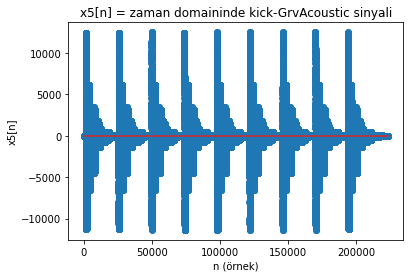

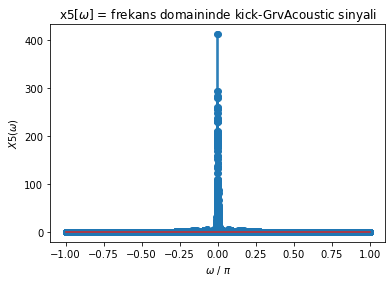

x5[n] işareti için:


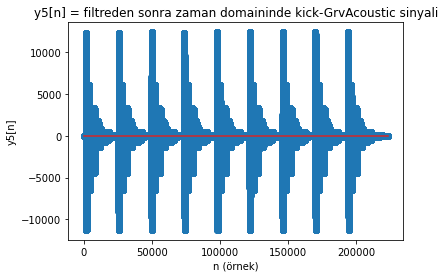

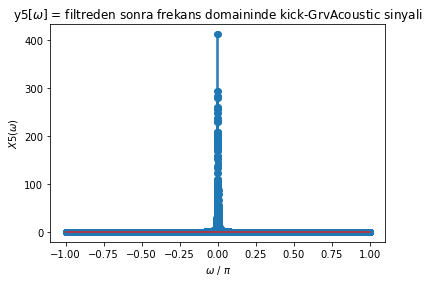

y5[n] işareti için:


In [22]:
Fs, x5 = read("C18_kick-GrvAcoustic.wav")
print(x5.shape) # x'in boyut bilgisi
print(Fs)
x5n = x5[:,1] # 1. kanal örnekleri
N = len(x5)
n=np.arange(0,N) # örnekleme iki periyot olacak şekilde

w = np.arange(-np.pi, np.pi, 2*np.pi/N) # omega ekseninin tanımlanması
x5w = np.fft.fftshift(np.fft.fft(x5n,N)/N) # işaretin Fourier transformu

# x5[n] sinyalini çizdirilmesi
plt.figure()
plt.stem(n,x5n)
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("x5[n]") # y ekseninin isimlendirilmesi
plt.title("x5[n] = zaman domaininde kick-GrvAcoustic sinyali")

# X5(w) işaretinin çizdirilmesi
plt.figure()
plt.stem(w/np.pi,abs(x5w))
plt.xlabel("$\omega$ / $\pi$") # x ekseninin isimlendirilmesi
plt.ylabel("$X5(\omega)$") # y ekseninin isimlendirilmesi
plt.title("x5[$\omega$] = frekans domaininde kick-GrvAcoustic sinyali")
plt.show()

# ses dosyasının oynatılabilmesi için
print('x5[n] işareti için:')
display(Audio(x5n, rate=Fs))

#-------------------- filtreden geçirme işlemi ---------#
filter_data = loadmat('C18_lowpass-fir-blackman.mat')
Coeffs = filter_data['ba'].astype(np.float)   

b = Coeffs[0] # filtre katsayısı
# a katsayısı için direkt 1 yazılmıştır çünkü kullanılan filtre bir fir filtredir.
y5n = sgnl.lfilter(b, 1, x5n) # filtre sonrası elde edilen ses işareti

# y5[n] sinyalini çizdirilmesi
plt.figure()
plt.stem(n,y5n)
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("y5[n]") # y ekseninin isimlendirilmesi
plt.title("y5[n] = filtreden sonra zaman domaininde kick-GrvAcoustic sinyali")


y5w = np.fft.fftshift(np.fft.fft(y5n,N)/N) # işaretin Fourier transformu

# Y5(w) işaretinin grafiğinin çizdirilmesi
plt.figure()
plt.stem(w/np.pi,abs(y5w))
plt.xlabel("$\omega$ / $\pi$") # x ekseninin isimlendirilmesi
plt.ylabel("$X5(\omega)$") # y ekseninin isimlendirilmesi
plt.title("y5[$\omega$] = filtreden sonra frekans domaininde kick-GrvAcoustic sinyali")
plt.show()

# ses dosyasının oynatılabilmesi için
print('y5[n] işareti için:')
display(Audio(y5n, rate=Fs))

---
---
---

(218880, 2)
44100


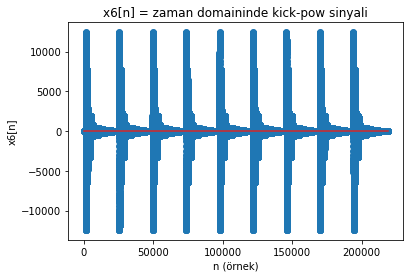

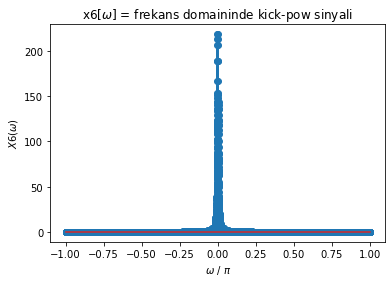

x6[n] işareti için:


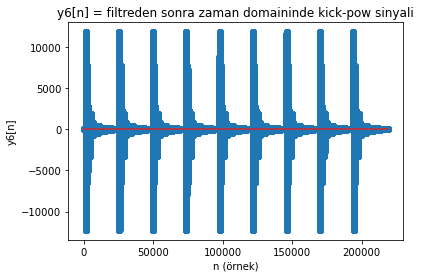

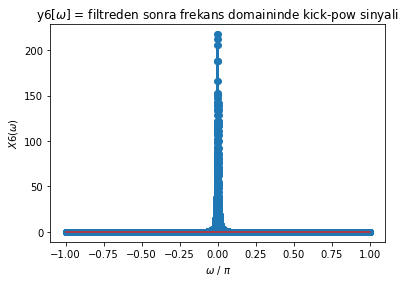

y6[n] işareti için:


In [23]:
Fs, x6 = read("C18_kick-pow.wav")
print(x6.shape) # x'in boyut bilgisi
print(Fs)
x6n = x6[:,1] # 1. kanal örnekleri
N = len(x6)
n=np.arange(0,N) # örnekleme iki periyot olacak şekilde

w = np.arange(-np.pi, np.pi, 2*np.pi/N) # omega ekseninin tanımlanması
x6w = np.fft.fftshift(np.fft.fft(x6n,N)/N) # işaretin Fourier transformu

# x6[n] sinyalini çizdirilmesi
plt.figure()
plt.stem(n,x6n)
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("x6[n]") # y ekseninin isimlendirilmesi
plt.title("x6[n] = zaman domaininde kick-pow sinyali")

# X6(w) işaretinin çizdirilmesi
plt.figure()
plt.stem(w/np.pi,abs(x6w))
plt.xlabel("$\omega$ / $\pi$") # x ekseninin isimlendirilmesi
plt.ylabel("$X6(\omega)$") # y ekseninin isimlendirilmesi
plt.title("x6[$\omega$] = frekans domaininde kick-pow sinyali")
plt.show()

# ses dosyasının oynatılabilmesi için
print('x6[n] işareti için:')
display(Audio(x6n, rate=Fs))

#-------------------- filtreden geçirme işlemi ---------#
filter_data = loadmat('C18_lowpass-fir-blackman.mat')
Coeffs = filter_data['ba'].astype(np.float)   

b = Coeffs[0] # filtre katsayısı
# a katsayısı için direkt 1 yazılmıştır çünkü kullanılan filtre bir fir filtredir.
y6n = sgnl.lfilter(b, 1, x6n) # filtre sonrası elde edilen ses işareti

# y6[n] sinyalini çizdirilmesi
plt.figure()
plt.stem(n,y6n)
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("y6[n]") # y ekseninin isimlendirilmesi
plt.title("y6[n] = filtreden sonra zaman domaininde kick-pow sinyali")


y6w = np.fft.fftshift(np.fft.fft(y6n,N)/N) # işaretin Fourier transformu

# Y6(w) işaretinin grafiğinin çizdirilmesi
plt.figure()
plt.stem(w/np.pi,abs(y6w))
plt.xlabel("$\omega$ / $\pi$") # x ekseninin isimlendirilmesi
plt.ylabel("$X6(\omega)$") # y ekseninin isimlendirilmesi
plt.title("y6[$\omega$] = filtreden sonra frekans domaininde kick-pow sinyali")
plt.show()

# ses dosyasının oynatılabilmesi için
print('y6[n] işareti için:')
display(Audio(y6n, rate=Fs))

---
---
---

In [29]:
# filtreden sonra elde edilen sinyallerin max değerleri alındı
value1 = max(abs(y1w))
value2 = max(abs(y2w))
value3 = max(abs(y3w))
value4 = max(abs(y4w))
value5 = max(abs(y5w))
value6 = max(abs(y6w))


# max değerler sample'lar ile dict yöntemiyle eşlendi
data = {
  "first_kick_sample": value1,
  "second_kick_sample": value2,
  "third_kick_sample": value3,
  "first_snare_sample": value4,
  "second_snare_sample": value5,
  "third_snare_sample": value6
}


def kick_or_snare(value_from_data):
    if(value_from_data > 200):
        print("bu bir kick sesidir.")
        if (value_from_data == value1):
            z = x1n
        elif (value_from_data == value2):
            z = x2n
        elif (value_from_data == value3):
            z = x3n
        elif (value_from_data == value4):
            z = x4n
        elif (value_from_data == value5):
            z = x5n
        elif (value_from_data == value6):
            z = x6n
        elif (value_from_data == value6):
            z = x6n
        display(Audio(z, rate=Fs))
        
    elif(data[value] < 200):
        print("bu bir snare sesidir.")
        if (value_from_data == value1):
            z = x1n
        elif (value_from_data == value2):
            z = x2n
        elif (value_from_data == value3):
            z = x3n
        elif (value_from_data == value4):
            z = x4n
        elif (value_from_data == value5):
            z = x5n
        elif (value_from_data == value6):
            z = x6n
        elif (value_from_data == value6):
            z = x6n
        display(Audio(z, rate=Fs))


# max genlik değeri 200'den küçükse kick
#                   200'den büyükse snare olması beklenmektedir.
for value in data:
    kick_or_snare(data[value])
# çıktı sonucu da dict yöntemiyle yapılan eşleştirmeye uymaktadır.

bu bir snare sesidir.


bu bir snare sesidir.


bu bir snare sesidir.


bu bir kick sesidir.


bu bir kick sesidir.


bu bir kick sesidir.
